In [1]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 65 bytes


In [2]:
!kaggle datasets download -d grassknoted/asl-alphabet

 99% 1.02G/1.03G [00:22<00:00, 55.2MB/s]
100% 1.03G/1.03G [00:22<00:00, 48.3MB/s]


In [3]:
!unzip asl-alphabet.zip
print('Done!')

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing190.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1900.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1901.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1902.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1903.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1904.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1905.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1906.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1907.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1908.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1909.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing191.jpg  
  inflating: 

In [4]:
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-umuqkocu
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-umuqkocu
     |████████████████████████████████| 1.0MB 2.9MB/s 
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0db27e762842ff3d1ca4f4f719222985ac6cfb41a_-cp37-none-any.whl size=151510 sha256=a00832b80fd930bbef759066a6410ecfc3769601b01ae99fb402741df1e3e5ce
  Stored in directory: /tmp/pip-ephem-wheel-cache-b72tjgfr/wheels/eb/1b/35/fce87697be00d2fc63e0b4b395b0d9c7e391a10e98d9a0d97f
Successfully built tensorflow-docs
  Found existing installation: protobuf 3.12.4
    Uninstalling protobuf-3.12.4:
      Successfully uninstalled protobuf-3.12.4


In [5]:
# TensorFlow and tf.keras
import tensorflow as tf

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_docs.modeling as modeling
import pathlib, tempfile
import seaborn as sn
import tensorflow_docs.plots as plots
import random

from sklearn.model_selection import train_test_split
from datetime import datetime

print(tf.__version__)

2.5.0


In [6]:
import tensorboard
tensorboard.__version__

'2.5.0'

In [7]:
import string

class_names = list(string.ascii_uppercase)

class_names.append('del')
class_names.append('nothing')
class_names.append('space')

print(class_names)
print(len(class_names))

['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'del', 'nothing', 'space']
29


In [8]:
import pandas as pd
from skimage.io import imread
import os, string
import cv2
from PIL import Image
import matplotlib.pyplot as plt

p = './asl_alphabet_train/asl_alphabet_train'

data = []
labels = []

for d in class_names:
  path = os.path.join(p, d)
  class_num = class_names.index(d)
  for img in os.listdir(path):
    img_array = cv2.imread(os.path.join(path,img), cv2.IMREAD_GRAYSCALE)
    img_array = cv2.resize(img_array, (50,50))
    data.append(img_array)
    labels.append(class_num)

data = np.array(data)
labels = np.array(labels)

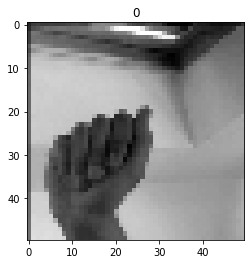

In [9]:
plt.imshow(data[0], cmap='gray')
plt.title(labels[0])
plt.show()

In [10]:
data.shape

(87000, 50, 50)

In [11]:
labels_df = pd.DataFrame(data=labels, columns=['label'])
labels_df.groupby(['label']).size()

label
0     3000
1     3000
2     3000
3     3000
4     3000
5     3000
6     3000
7     3000
8     3000
9     3000
10    3000
11    3000
12    3000
13    3000
14    3000
15    3000
16    3000
17    3000
18    3000
19    3000
20    3000
21    3000
22    3000
23    3000
24    3000
25    3000
26    3000
27    3000
28    3000
dtype: int64

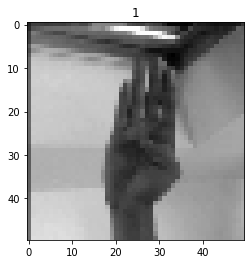

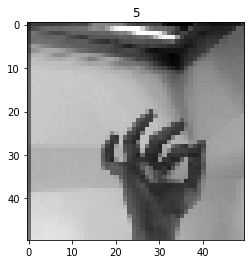

In [12]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, shuffle=True)

plt.imshow(X_train[0], cmap='gray')
plt.title(y_train[0])
plt.show()

plt.imshow(X_test[0], cmap='gray')
plt.title(y_test[0])
plt.show()

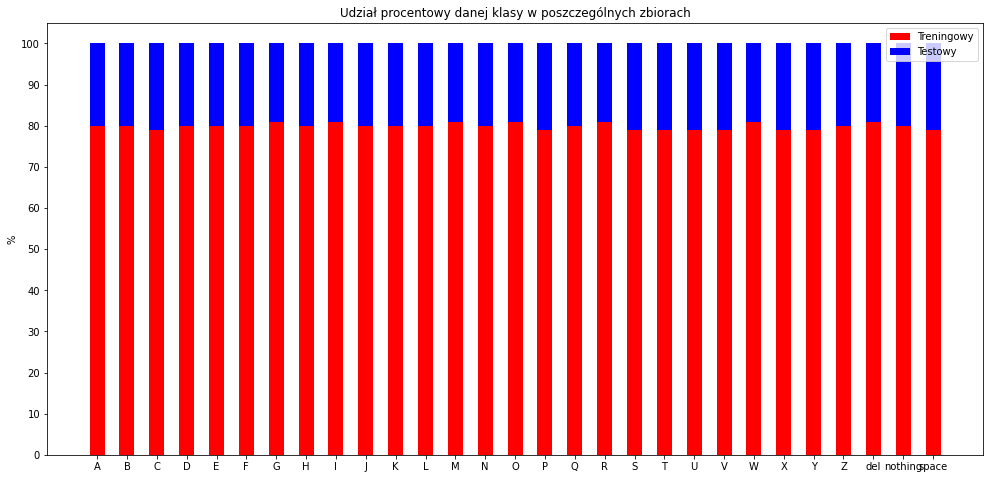

In [13]:
train_labels_df = pd.DataFrame(data=y_train, columns=['label'])
train_labels_grouped = train_labels_df.groupby(['label']).size()

test_labels_df = pd.DataFrame(data=y_test, columns=['label'])
test_labels_grouped = test_labels_df.groupby(['label']).size()

N = len(train_labels_grouped)
ind = np.arange(N) # the x locations for the groups
width = 0.5
fig = plt.figure(figsize=(13,6))
ax = fig.add_axes([0,0,1,1])
ax.bar(ind, round(train_labels_grouped/3000, 2)*100, width, color='r')
ax.bar(ind, round(test_labels_grouped/3000, 2)*100, width, bottom=round(train_labels_grouped/3000, 2)*100, color='b')
ax.set_ylabel('%')
ax.set_title('Udział procentowy danej klasy w poszczególnych zbiorach')
plt.xticks(range(0,29), class_names)
ax.set_yticks(np.arange(0, 101, 10))
ax.legend(labels=['Treningowy', 'Testowy'])
plt.show()

In [14]:
X_train = X_train / 255.0

X_test = X_test / 255.0

print(X_train.min(), X_train.max())
print(X_test.min(), X_test.max())

0.00392156862745098 1.0
0.00392156862745098 1.0


In [15]:
X_train.shape

(69600, 50, 50)

In [16]:
print(y_train.max())
print(y_train.min())

28
0


In [17]:
def get_callbacks(name):
  logdir="logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")

  return [
    modeling.EpochDots(),
    tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=200),
    tf.keras.callbacks.TensorBoard(log_dir=logdir),
  ]

def compile_and_fit(model, name, X, y, X_t, y_t, optimizer=None, max_epochs=100):
  if optimizer is None:
    optimizer = get_optimizer()
  model.compile(optimizer=optimizer, loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

  model.summary()

  history = model.fit(
    X,
    y,
    epochs=max_epochs,
    validation_data=(X_t, y_t),
    callbacks=get_callbacks(name),
    verbose=2)
  return history

In [18]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(50, 50)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(29)
])

In [19]:
size_histories = {}

size_histories['Main Dense'] = compile_and_fit(model, "sizes/Medium", X_train, y_train, X_test, y_test, 'adam', 10)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 2500)              0         
_________________________________________________________________
dense (Dense)                (None, 128)               320128    
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_2 (Dense)              (None, 29)                1885      
Total params: 330,269
Trainable params: 330,269
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
2175/2175 - 9s - loss: 2.5185 - accuracy: 0.2369 - val_loss: 1.8767 - val_accuracy: 0.3825

Epoch: 0, accuracy:0.2369,  loss:2.5185,  val_accuracy:0.3825,  val_loss:1.8767,  
.Epoch 2/10
2175/2175 - 7s - loss: 1.5891 - accuracy: 0.4773 -

In [20]:
c_n = list(string.ascii_uppercase)

c_n.append('d')
c_n.append('n')
c_n.append('s')

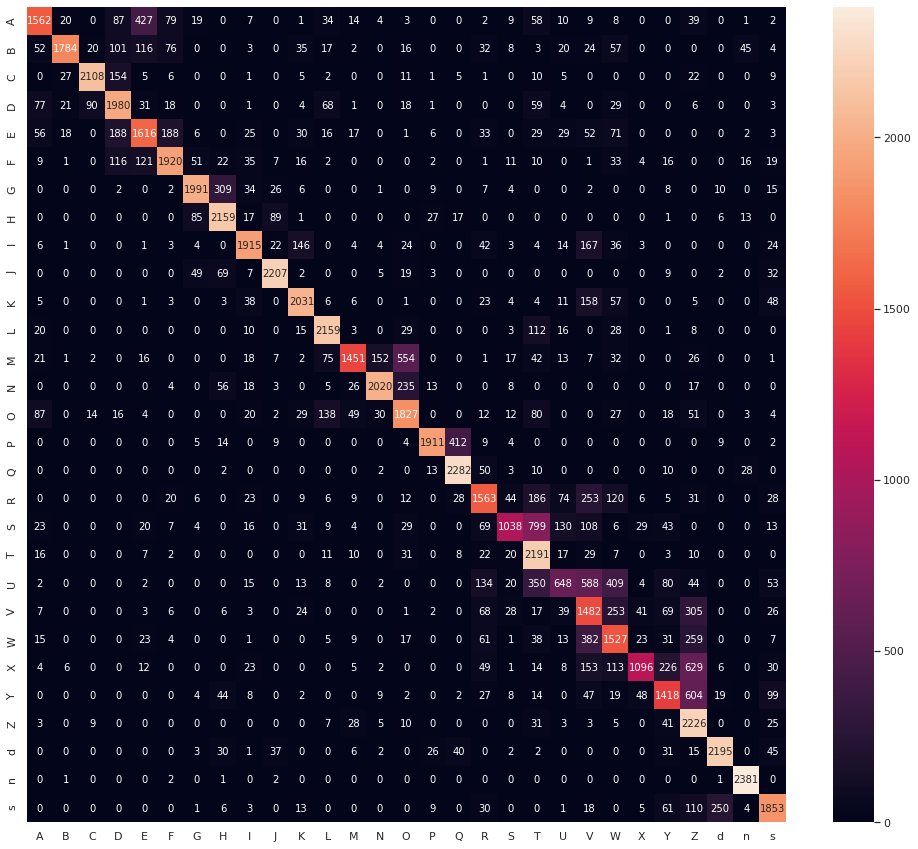

In [21]:
probability_model = tf.keras.Sequential([model, tf.keras.layers.Softmax()])

predictions = probability_model.predict(X_train)

pred = predictions.argmax(axis = 1)[:,None].flatten()

confusion_matrix = tf.math.confusion_matrix(y_train, pred)

df_cm = pd.DataFrame(np.array(confusion_matrix).astype(int), c_n, c_n)
plt.figure(figsize=(17,15))
sn.set(font_scale=1)
sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, fmt='g')

plt.show()

In [22]:
test_loss, test_acc = model.evaluate(X_test,  y_test, verbose=2)

print('\nTest loss:', test_loss)
print('\nTest accuracy:', test_acc)


544/544 - 1s - loss: 0.6965 - accuracy: 0.7410

Test loss: 0.6964759230613708

Test accuracy: 0.7410345077514648


(0.2, 0.8)

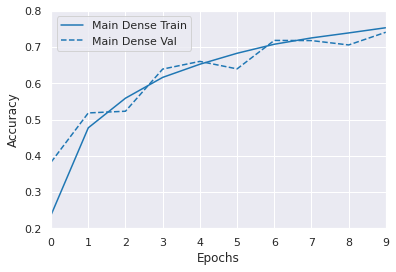

In [56]:
plotter = plots.HistoryPlotter(metric = 'accuracy', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense']
})
plt.ylim([0.2, 0.8])

(0.5, 2.7)

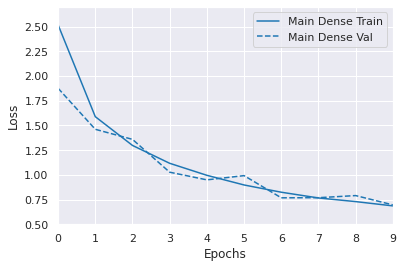

In [57]:
plotter = plots.HistoryPlotter(metric = 'loss', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense']
})
plt.ylim([0.5, 2.7])

In [25]:
probability_model = tf.keras.Sequential([model, tf.keras.layers.Softmax()])

predictions = probability_model.predict(X_test)

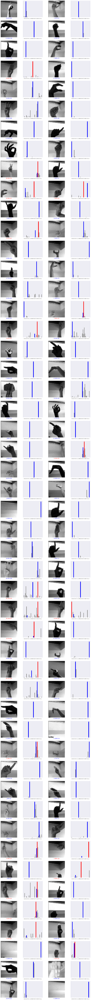

In [26]:
min = 0
max = len(X_test)-1

fig, axs = plt.subplots(50, 4, figsize=(18,200))

arr = []
pred100 = []
true_arr = []

for i in range(100):
  rand = random.randint(min, max)
  while rand in arr:
    rand = random.randint(min, max)

  pred100.append(predictions[rand])
  true_arr.append(y_test[rand])

  if i%2:
    a=2
    b=3
  else:
    a=0
    b=1

  true_label = y_test[rand]
  predicted_label = np.argmax(predictions[rand])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  axs[int(i/2), a].imshow(X_test[rand], cmap='gray')
  axs[int(i/2), a].grid(False)
  axs[int(i/2), a].set_xticks([])
  axs[int(i/2), a].set_yticks([])
  axs[int(i/2), a].set_xlabel("{} {:2.0f}% ({})".format(c_n[predicted_label],
                                100*np.max(predictions[rand]),
                                c_n[true_label]),
                                fontdict={'color': color})

  axs[int(i/2), b].set_xticks(range(29))
  axs[int(i/2), b].set_xticklabels(c_n, fontdict={'fontsize': 8})
  axs[int(i/2), b].set_yticks([])
  thisplot = axs[int(i/2), b].bar(range(29), predictions[rand], color="#777777")

  thisplot[predicted_label].set_color('red')
  thisplot[true_label].set_color('blue')

plt.show()

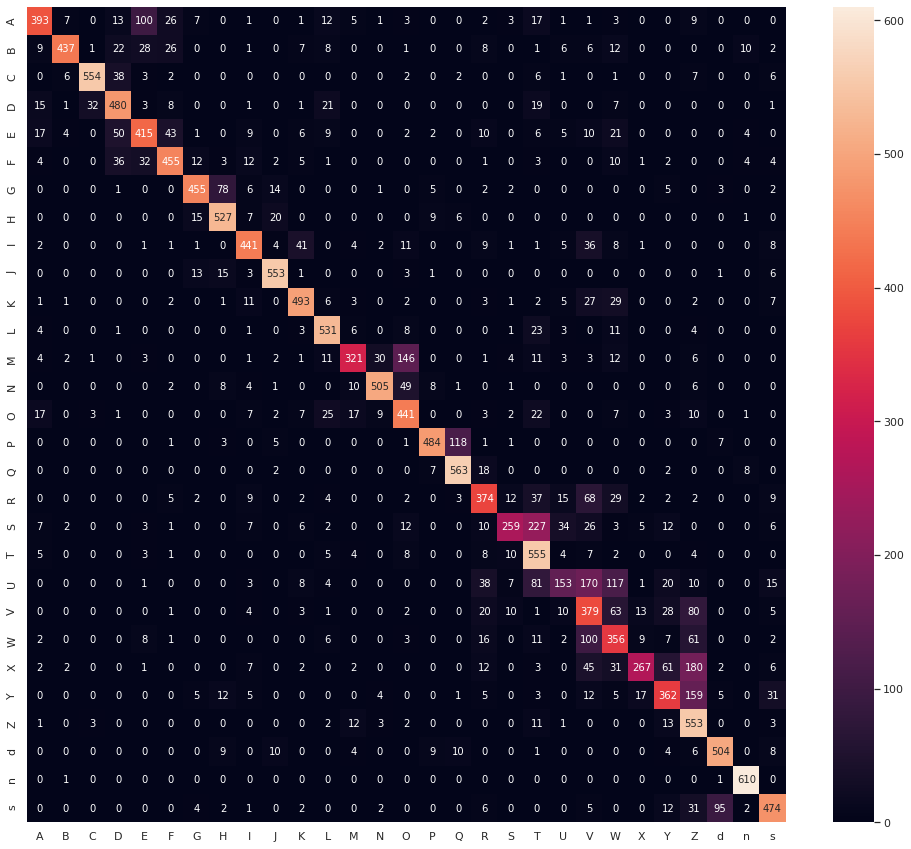

In [27]:
pred = predictions.argmax(axis = 1)[:,None].flatten()

confusion_matrix = tf.math.confusion_matrix(y_test, pred)

df_cm = pd.DataFrame(np.array(confusion_matrix).astype(int), c_n, c_n)
plt.figure(figsize=(17,15))
sn.set(font_scale=1)
sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, fmt='g')

plt.show()

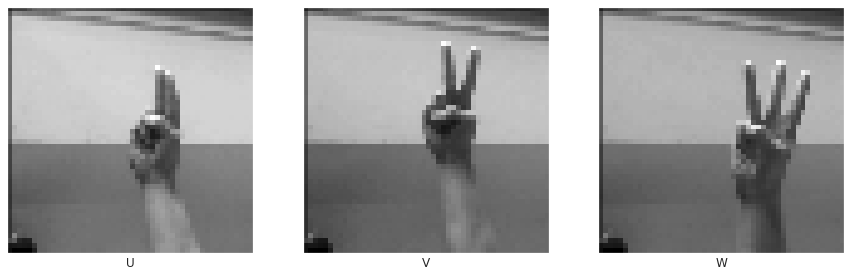

In [28]:
fig, axs = plt.subplots(1, 3, figsize=(15,5))

axs[0].imshow(data[60001], cmap='gray')
axs[0].grid(False)
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_xlabel("U")

axs[1].imshow(data[63001], cmap='gray')
axs[1].grid(False)
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xlabel("V")

axs[2].imshow(data[66002], cmap='gray')
axs[2].grid(False)
axs[2].set_xticks([])
axs[2].set_yticks([])
axs[2].set_xlabel("W")

plt.show()

In [29]:
%load_ext tensorboard

%tensorboard --logdir logs

Output hidden; open in https://colab.research.google.com to view.

In [30]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(50, 50)),
    tf.keras.layers.Dense(128, activation='softmax'),
    tf.keras.layers.Dense(64, activation='softmax'),
    tf.keras.layers.Dense(29)
])

size_histories['Softmax Dense'] = compile_and_fit(model, "sizes/Medium", X_train, y_train, X_test, y_test, 'adam', 10)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 2500)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 128)               320128    
_________________________________________________________________
dense_4 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_5 (Dense)              (None, 29)                1885      
Total params: 330,269
Trainable params: 330,269
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
2175/2175 - 9s - loss: 3.3679 - accuracy: 0.0345 - val_loss: 3.3681 - val_accuracy: 0.0332

Epoch: 0, accuracy:0.0345,  loss:3.3679,  val_accuracy:0.0332,  val_loss:3.3681,  
.Epoch 2/10
2175/2175 - 8s - loss: 3.3679 - accuracy: 0.0335

(0.0, 0.8)

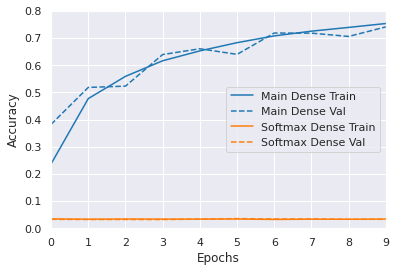

In [54]:
plotter = plots.HistoryPlotter(metric = 'accuracy', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    "Softmax Dense": size_histories['Softmax Dense']
})
plt.ylim([0, 0.8])

(0.5, 3.5)

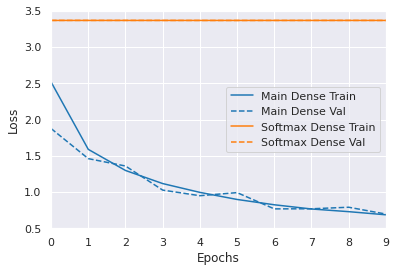

In [55]:
plotter = plots.HistoryPlotter(metric = 'loss', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    "Softmax Dense": size_histories['Softmax Dense']
})
plt.ylim([0.5, 3.5])

In [33]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(50, 50)),
    tf.keras.layers.Dense(128, activation='elu'),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(29)
])

size_histories['Elu Dense'] = compile_and_fit(model, "sizes/Medium", X_train, y_train, X_test, y_test, 'adam', 10)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_2 (Flatten)          (None, 2500)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)               320128    
_________________________________________________________________
dense_7 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_8 (Dense)              (None, 29)                1885      
Total params: 330,269
Trainable params: 330,269
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
2175/2175 - 9s - loss: 2.3780 - accuracy: 0.2773 - val_loss: 1.6801 - val_accuracy: 0.4522

Epoch: 0, accuracy:0.2773,  loss:2.3780,  val_accuracy:0.4522,  val_loss:1.6801,  
.Epoch 2/10
2175/2175 - 8s - loss: 1.4115 - accuracy: 0.5253

(0.2, 1.0)

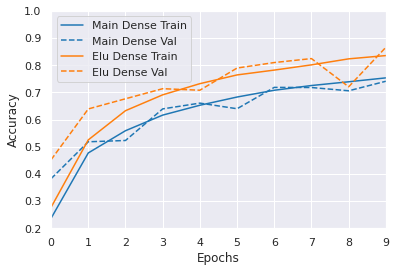

In [58]:
plotter = plots.HistoryPlotter(metric = 'accuracy', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    'Elu Dense': size_histories['Elu Dense']
})
plt.ylim([0.2, 1])

(0.3, 2.7)

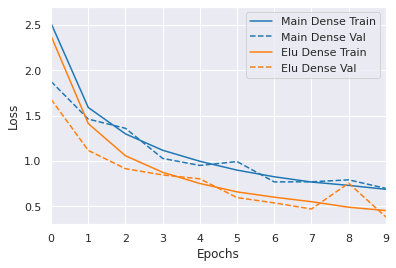

In [59]:
plotter = plots.HistoryPlotter(metric = 'loss', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    'Elu Dense': size_histories['Elu Dense']
})
plt.ylim([0.3, 2.7])

In [36]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(50, 50)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(29)
])

size_histories['100 ep'] = compile_and_fit(model, "sizes/Medium", X_train, y_train, X_test, y_test, 'adam', 100)

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_3 (Flatten)          (None, 2500)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 128)               320128    
_________________________________________________________________
dense_10 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_11 (Dense)             (None, 29)                1885      
Total params: 330,269
Trainable params: 330,269
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
2175/2175 - 8s - loss: 2.5809 - accuracy: 0.2186 - val_loss: 2.0024 - val_accuracy: 0.3347

Epoch: 0, accuracy:0.2186,  loss:2.5809,  val_accuracy:0.3347,  val_loss:2.0024,  
.Epoch 2/100
2175/2175 - 7s - loss: 1.7046 - accuracy: 0.43

(0.3, 1.0)

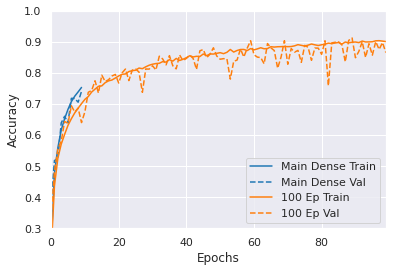

In [65]:
plotter = plots.HistoryPlotter(metric = 'accuracy', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    '100 ep': size_histories['100 ep']
})
plt.ylim([0.3, 1])

(0.0, 2.7)

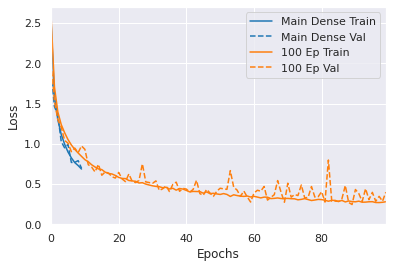

In [66]:
plotter = plots.HistoryPlotter(metric = 'loss', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    '100 ep': size_histories['100 ep']
})
plt.ylim([0, 2.7])

In [39]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(50, 50)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(29)
])
size_histories['Small layers'] = compile_and_fit(model, "sizes/Medium", X_train, y_train, X_test, y_test, 'adam', 10)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_4 (Flatten)          (None, 2500)              0         
_________________________________________________________________
dense_12 (Dense)             (None, 64)                160064    
_________________________________________________________________
dense_13 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_14 (Dense)             (None, 29)                957       
Total params: 163,101
Trainable params: 163,101
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
2175/2175 - 7s - loss: 3.1558 - accuracy: 0.0665 - val_loss: 2.9908 - val_accuracy: 0.0925

Epoch: 0, accuracy:0.0665,  loss:3.1558,  val_accuracy:0.0925,  val_loss:2.9908,  
.Epoch 2/10
2175/2175 - 6s - loss: 2.7787 - accuracy: 0.1292

(0.0, 0.8)

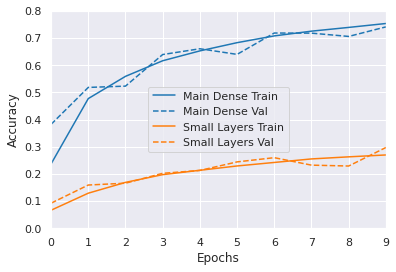

In [67]:
plotter = plots.HistoryPlotter(metric = 'accuracy', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    'Small layers': size_histories['Small layers']
})
plt.ylim([0, 0.8])

(0.4, 3.5)

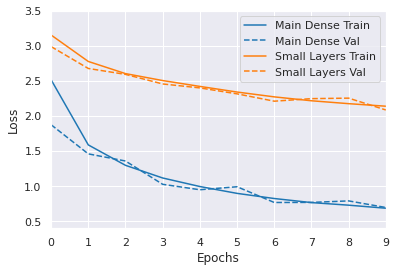

In [71]:
plotter = plots.HistoryPlotter(metric = 'loss', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    'Small layers': size_histories['Small layers']
})
plt.ylim([0.4, 3.5])

In [42]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(50, 50)),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(29)
])

size_histories['Big layers'] = compile_and_fit(model, "sizes/Medium", X_train, y_train, X_test, y_test, 'adam', 10)

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_5 (Flatten)          (None, 2500)              0         
_________________________________________________________________
dense_15 (Dense)             (None, 256)               640256    
_________________________________________________________________
dense_16 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_17 (Dense)             (None, 29)                3741      
Total params: 676,893
Trainable params: 676,893
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
2175/2175 - 17s - loss: 2.3753 - accuracy: 0.2728 - val_loss: 1.7615 - val_accuracy: 0.4157

Epoch: 0, accuracy:0.2728,  loss:2.3753,  val_accuracy:0.4157,  val_loss:1.7615,  
.Epoch 2/10
2175/2175 - 15s - loss: 1.3816 - accuracy: 0.53

(0.2, 0.9)

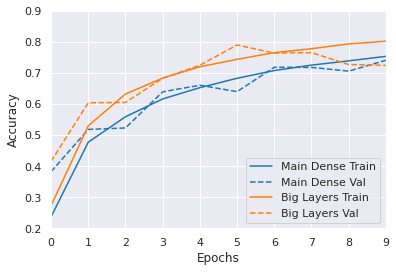

In [73]:
plotter = plots.HistoryPlotter(metric = 'accuracy', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    'Big layers': size_histories['Big layers']
})
plt.ylim([0.2, 0.9])

(0.3, 2.7)

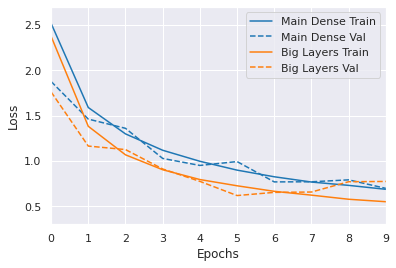

In [75]:
plotter = plots.HistoryPlotter(metric = 'loss', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    'Big layers': size_histories['Big layers']
})
plt.ylim([0.3, 2.7])

In [45]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(50, 50)),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(29)
])

size_histories['More layers'] = compile_and_fit(model, "sizes/Medium", X_train, y_train, X_test, y_test, 'adam', 10)

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_6 (Flatten)          (None, 2500)              0         
_________________________________________________________________
dense_18 (Dense)             (None, 512)               1280512   
_________________________________________________________________
dense_19 (Dense)             (None, 256)               131328    
_________________________________________________________________
dense_20 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_21 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_22 (Dense)             (None, 29)                1885      
Total params: 1,454,877
Trainable params: 1,454,877
Non-trainable params: 0
____________________________________________

(0.1, 0.9)

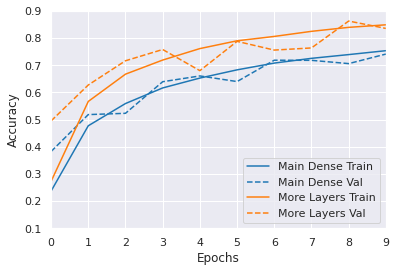

In [76]:
plotter = plots.HistoryPlotter(metric = 'accuracy', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    'More layers': size_histories['More layers']
})
plt.ylim([0.1, 0.9])

(0.0, 2.7)

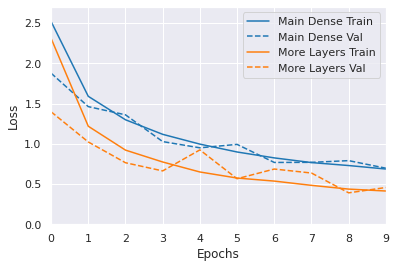

In [78]:
plotter = plots.HistoryPlotter(metric = 'loss', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    'More layers': size_histories['More layers']
})
plt.ylim([0, 2.7])

In [48]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='elu', input_shape=(50, 50, 1)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='elu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='elu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='elu'),
    tf.keras.layers.Dense(29)
])

size_histories['Elu Conv'] = compile_and_fit(model, "sizes/Medium", X_train.reshape(69600, 50, 50, 1), y_train, X_test.reshape(17400, 50, 50, 1), y_test, 'adam', 10)

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 48, 48, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 24, 24, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 22, 22, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 11, 11, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 9, 9, 64)          36928     
_________________________________________________________________
flatten_7 (Flatten)          (None, 5184)              0         
_________________________________________________________________
dense_23 (Dense)             (None, 64)               

(0.0, 1.0)

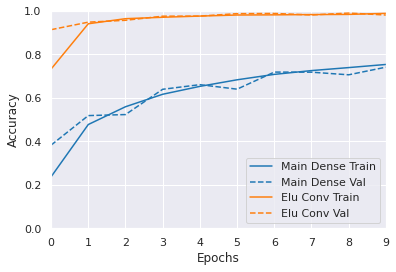

In [79]:
plotter = plots.HistoryPlotter(metric = 'accuracy', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    'Elu Conv': size_histories['Elu Conv']
})
plt.ylim([0, 1])

(0.0, 2.7)

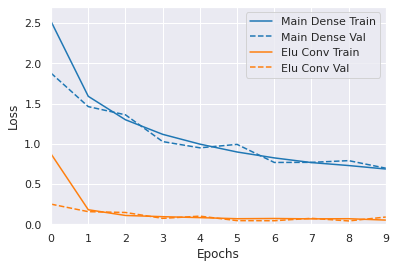

In [80]:
plotter = plots.HistoryPlotter(metric = 'loss', smoothing_std=0)
plotter.plot({
    "Main Dense": size_histories['Main Dense'],
    'Elu Conv': size_histories['Elu Conv']
})
plt.ylim([0, 2.7])

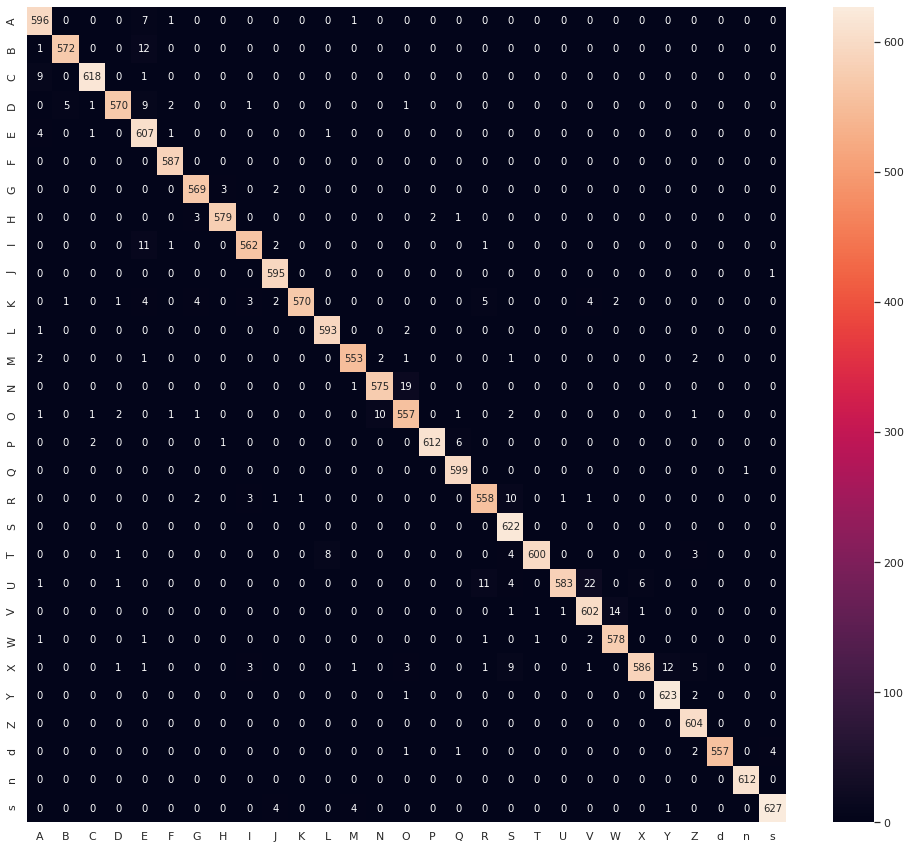

In [51]:
probability_model = tf.keras.Sequential([model, tf.keras.layers.Softmax()])

predictions = probability_model.predict(X_test.reshape(17400, 50, 50, 1))

pred = predictions.argmax(axis = 1)[:,None].flatten()

confusion_matrix = tf.math.confusion_matrix(y_test, pred)

df_cm = pd.DataFrame(np.array(confusion_matrix).astype(int), c_n, c_n)
plt.figure(figsize=(17,15))
sn.set(font_scale=1)
sn.heatmap(df_cm, annot=True, annot_kws={"size": 10}, fmt='g')

plt.show()